In [26]:
# =============================================================================
# CLASSIFICAÇÃO E VISUALIZAÇÃO DE KEYPOINTS COM AP-10K E HRNet
# =============================================================================

import os
import json
import torch
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from torch import nn
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from torchvision.transforms.functional import to_pil_image
from torch.utils.data import Dataset
from torchvision import transforms
from torchvision.io import read_image


In [27]:
#!pip install "numpy<2.0"

In [28]:
from torchvision.io import read_image

class AP10KDataset(Dataset):
    def __init__(self, root_dir, split_file, tensor_transform=None):
        self.root = root_dir
        self.tensor_transform = tensor_transform

        ann_path = os.path.join(self.root, 'annotations', split_file)
        data = json.load(open(ann_path, 'r'))
        dog_id = next(c['id'] for c in data['categories']
                      if c['name'].lower() == 'dog')
        dog_anns = [a for a in data['annotations']
                    if a['category_id'] == dog_id]
        id2file = {img['id']: img['file_name'] for img in data['images']}

        self.samples = []
        for ann in dog_anns:
            fn = id2file[ann['image_id']]
            kpt = np.array(ann['keypoints'], dtype=np.float32).reshape(-1, 3)
            self.samples.append((fn, kpt))

    def __len__(self):
        return len(self.samples)

    def __getitem__(self, idx):
        fn, kpt = self.samples[idx]
        img = Image.open(os.path.join(self.root, 'data', fn)).convert('RGB')

        # 1) carrega e transforma a imagem em tensor já normalizada
        img_t = read_image(os.path.join(self.root, 'data', fn)).float() / 255.0
        img_t = transforms.Resize((256,256))(img_t)
        img_t = transforms.Normalize(
            mean=[0.485,0.456,0.406],
            std=[0.229,0.224,0.225],
        )(img_t)

        # 2) normaliza keypoints para [0,1]
        W, H = img.size
        kpt_norm = kpt.copy()
        kpt_norm[:,0] /= W
        kpt_norm[:,1] /= H

        # 3) converte para tensor SEM usar from_numpy
        kpt_t = torch.tensor(kpt_norm, dtype=torch.float32).view(-1)

        return img_t, kpt_t


In [29]:
# Métrica PCK (Percentage of Correct Keypoints)
def compute_pck(preds, targets, threshold=0.05):
    distances = torch.norm(preds[:, :, :2] - targets[:, :, :2], dim=-1)
    correct = distances < threshold
    return correct.float().mean().item()

In [30]:
from torchvision import transforms
from torch.utils.data import DataLoader

# ————— Configurações de caminho —————
root_dir   = 'notebooks/AP10K/ap-10k'
train_file = 'ap10k-train-split1.json'
val_file   = 'ap10k-val-split1.json'

# Pipeline completo EM TENSOR:
#   1) Resize (funciona em Tensor a partir da v0.8)
#   2) Normalize (entrada C×H×W já em [0,1])
tensor_tf = transforms.Compose([
    transforms.Resize((256, 256)),        # redimensiona H×W em Tensor
    transforms.Normalize(                 # normaliza canais
        mean=[0.485, 0.456, 0.406],
        std= [0.229, 0.224, 0.225],
    ),
])

# instancia datasets passando só o tensor_transform
train_ds = AP10KDataset(
    root_dir,
    train_file,
    tensor_transform=tensor_tf
)
val_ds = AP10KDataset(
    root_dir,
    val_file,
    tensor_transform=tensor_tf
)

# DataLoaders
train_loader = DataLoader(
    train_ds,
    batch_size=16,
    shuffle=True,
    num_workers=0,    # você pode aumentar se não tiver mais bus errors
    pin_memory=True
)
val_loader = DataLoader(
    val_ds,
    batch_size=16,
    shuffle=False,
    num_workers=0,
    pin_memory=True
)


In [31]:
# ————— logo após carregar o JSON de anotações —————
ann = json.load(open(os.path.join(root_dir,'annotations', train_file), 'r'))
cat = next(c for c in ann['categories'] if c['name'].lower()=='dog')

# nomes e esqueleto vindo do JSON (1-based):
kpt_names = cat['keypoints']             # lista de strings
skeleton_1b = cat['skeleton']            # lista de pares [parent,child] 1-based

# converte para 0-based e filtra só os pares válidos para num_joints atuais
num_joints = len(kpt_names)
skeleton = [(u-1, v-1) for u,v in skeleton_1b
            if 1 <= u <= num_joints and 1 <= v <= num_joints]

In [32]:
import os 

os.system('ls notebooks/AP10K/ap-10k' )

annotations
data


0

In [33]:
import torch
import torch.nn as nn
from torchvision.models import resnet18   # ← importe aqui

# -----------------------------------------------------------------------------
# 3) MODELO: ResNet-18 pré-treinada + cabeça de regressão de keypoints
# -----------------------------------------------------------------------------
backbone = resnet18(pretrained=True)
backbone.fc = nn.Identity()  # remove a última camada fully-connected

num_joints = 17  # ao invés de 23
head = nn.Sequential(
    nn.Linear(512, 512),
    nn.ReLU(inplace=True),
    nn.Dropout(0.2),
    nn.Linear(512, num_joints * 3),  # agora 17*3 = 51
    nn.Sigmoid(),
)

model = nn.Sequential(backbone, head).cuda()

# Verificação rápida de shapes:
x = torch.randn(16, 3, 256, 256).cuda()
out = model(x)
print('Saída do modelo:', out.shape)  
# deverá ser [16, num_joints * 3]

# Rearranjando para [16, num_joints, 3]:
out = out.view(-1, num_joints, 3)
print('Regressão final:', out.shape)


Saída do modelo: torch.Size([16, 51])
Regressão final: torch.Size([16, 17, 3])


In [34]:
# -----------------------------------------------------------------------------
# 4) CRITÉRIO E OTIMIZADOR
# -----------------------------------------------------------------------------
criterion = nn.MSELoss()
optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)

In [35]:
#-----------------------------------------------------------------------------
# 5) ROTINA DE TREINO
# -----------------------------------------------------------------------------
import torchvision.transforms.functional as TF  # <— add isso lá no topo

def train_epoch(loader):
    model.train()
    total_loss = 0
    for imgs, kpts in loader:
        imgs = imgs.cuda()
        target = kpts.cuda()
        pred = model(imgs)
        loss = criterion(pred, target)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        total_loss += loss.item() * imgs.size(0)
    return total_loss / len(loader.dataset)

def eval_epoch(loader):
    model.eval()
    total_loss = 0
    total_pck = 0
    with torch.no_grad():
        for imgs, kpts in loader:
            imgs = imgs.cuda()
            target = kpts.cuda().view(-1, num_joints, 3)
            pred = model(imgs).view(-1, num_joints, 3)
            total_loss += criterion(pred, target).item() * imgs.size(0)
            total_pck += compute_pck(pred, target) * imgs.size(0)
    avg_loss = total_loss / len(loader.dataset)
    avg_pck = total_pck / len(loader.dataset)
    return avg_loss, avg_pck


In [36]:
import torch
torch.cuda.empty_cache()


In [37]:
# -----------------------------------------------------------------------------
# 6) LOOP DE TREINO/VALIDAÇÃO
# -----------------------------------------------------------------------------

EPOCHS = 25
for ep in range(1, EPOCHS+1):
    tr_loss = train_epoch(train_loader)
    val_loss, val_pck = eval_epoch(val_loader)
    print(f"Ep {ep:02d} — Train loss: {tr_loss:.4f} | Val loss: {val_loss:.4f} | Val PCK@0.05: {val_pck:.4f}")

Ep 01 — Train loss: 0.4289 | Val loss: 0.3506 | Val PCK@0.05: 0.0112
Ep 02 — Train loss: 0.3378 | Val loss: 0.3326 | Val PCK@0.05: 0.0396
Ep 03 — Train loss: 0.3170 | Val loss: 0.3318 | Val PCK@0.05: 0.0652
Ep 04 — Train loss: 0.3078 | Val loss: 0.3214 | Val PCK@0.05: 0.0551
Ep 05 — Train loss: 0.2980 | Val loss: 0.3246 | Val PCK@0.05: 0.0877
Ep 06 — Train loss: 0.2909 | Val loss: 0.3209 | Val PCK@0.05: 0.1064
Ep 07 — Train loss: 0.2872 | Val loss: 0.3266 | Val PCK@0.05: 0.1123
Ep 08 — Train loss: 0.2811 | Val loss: 0.3216 | Val PCK@0.05: 0.0850
Ep 09 — Train loss: 0.2760 | Val loss: 0.3179 | Val PCK@0.05: 0.0743
Ep 10 — Train loss: 0.2732 | Val loss: 0.3250 | Val PCK@0.05: 0.1519
Ep 11 — Train loss: 0.2687 | Val loss: 0.3184 | Val PCK@0.05: 0.0813
Ep 12 — Train loss: 0.2660 | Val loss: 0.3167 | Val PCK@0.05: 0.1070
Ep 13 — Train loss: 0.2648 | Val loss: 0.3229 | Val PCK@0.05: 0.1112
Ep 14 — Train loss: 0.2610 | Val loss: 0.3240 | Val PCK@0.05: 0.0850
Ep 15 — Train loss: 0.2586 | Val l

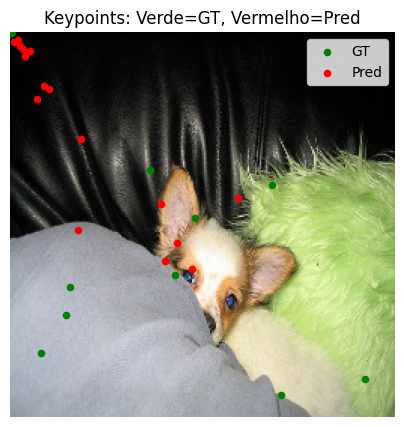

In [12]:
import matplotlib.pyplot as plt

model.eval()
batch = next(iter(val_loader))
imgs, targets = batch
with torch.no_grad():
    preds = model(imgs.cuda()).cpu().view(-1, 17, 3)  # [B,17,3]

# pega o primeiro da batch
img = imgs[1]           # tensor [3,256,256]
gt_tensor = targets[0].view(-1,3).cpu()
pr_tensor = preds[0]

# desnormaliza o tensor de imagem e converte pra uint8 Python lists
mean = [0.485, 0.456, 0.406]
std  = [0.229, 0.224, 0.225]

img_dn = img.clone()
for c in range(3):
    img_dn[c].mul_(std[c]).add_(mean[c])
# agora img_dn está em [0,1]; converte pra [0–255] uint8
img_byte = (img_dn.mul(255).clamp(0,255)
                 .byte()
                 .permute(1,2,0))  # H×W×C
# transforma em nested lists de ints
img_list = img_byte.tolist()

# extrai coordenadas
gt_xy = [(float(x*256), float(y*256)) for x,y,_ in gt_tensor.tolist()]
pr_xy = [(float(x*256), float(y*256)) for x,y,_ in pr_tensor.tolist()]

plt.figure(figsize=(5,5))
plt.imshow(img_list)
xs, ys = zip(*gt_xy)
plt.scatter(xs, ys, c='g', s=20, label='GT')
xs, ys = zip(*pr_xy)
plt.scatter(xs, ys, c='r', s=20, label='Pred')
plt.legend()
plt.title("Keypoints: Verde=GT, Vermelho=Pred")
plt.axis('off')
plt.show()


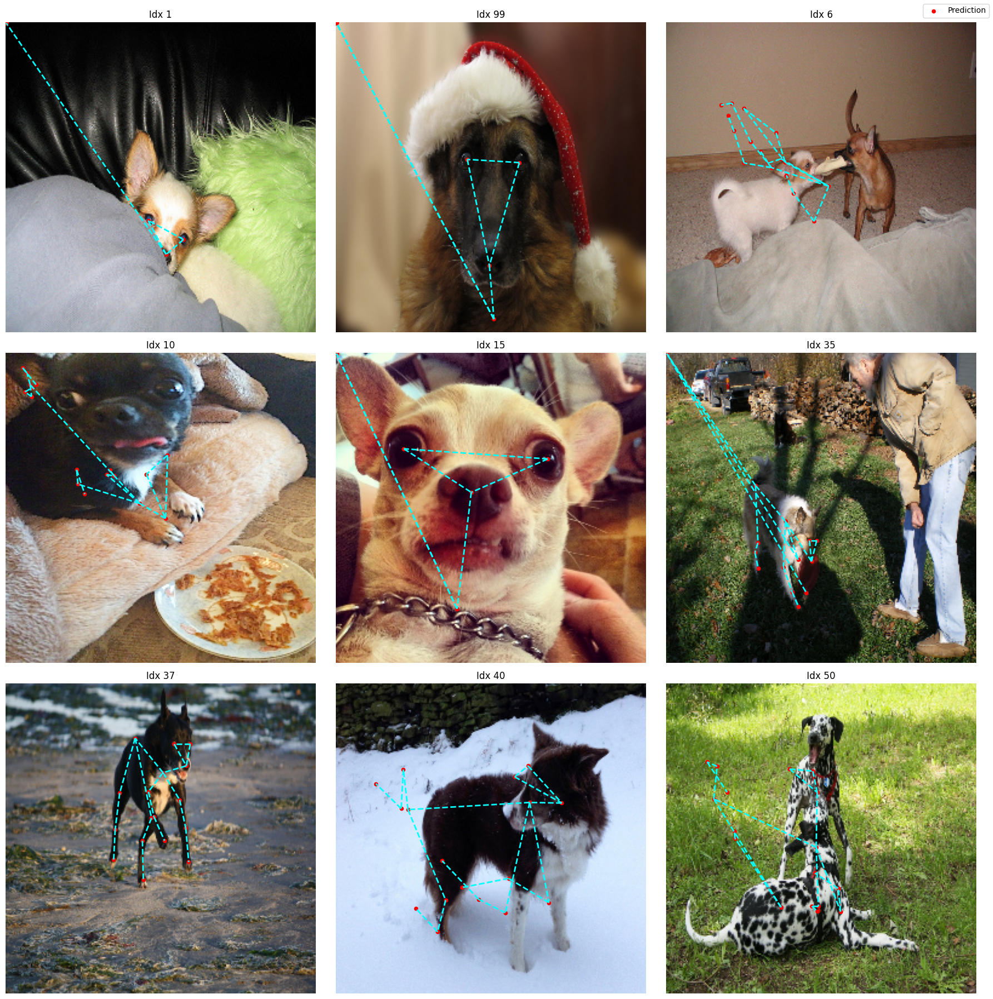

In [24]:
def plot_multiple_samples(indices):
    model.eval()
    fig, axes = plt.subplots(3, 3, figsize=(18, 18))
    axes = axes.flatten()

    for idx, ax in zip(indices, axes):
        img_t, kpt_true = val_ds[idx]
        with torch.no_grad():
            pr = model(img_t.unsqueeze(0).cuda()).cpu().view(-1, 3)

        # desnormaliza
        img_dn = img_t.clone()
        for c in range(3):
            img_dn[c].mul_(std[c]).add_(mean[c])
        img_byte = (img_dn.mul(255).clamp(0,255)
                         .byte()
                         .permute(1,2,0))
        img_list = img_byte.tolist()
        H, W, _ = img_byte.shape

        # coords em pixels
        gt_list = kpt_true.view(-1,3).cpu().tolist()
        gt_xy = [(p[0]*W, p[1]*H) for p in gt_list]
        pred_xy = [(p[0]*W, p[1]*H) for p in pr.tolist()]

        # mostra imagem
        ax.imshow(img_list)

        # conexões do esqueleto
        for a, b in skeleton:
            if idx % 2 == 0:
                x0, y0 = pred_xy[a]
                x1, y1 = pred_xy[b]
            else:
                x0, y0 = gt_xy[a]
                x1, y1 = gt_xy[b]
            ax.plot([x0, x1], [y0, y1], '--', color='cyan', lw=2)

        xs_pred = pred_xy if idx % 2 == 0 else gt_xy
        xs, ys = zip(*xs_pred)
        ax.scatter(xs, ys, c='red', s=20, label='Prediction')

        ax.set_title(f"Idx {idx}")
        ax.axis('off')

    handles, labels = ax.get_legend_handles_labels()
    fig.legend(handles, labels, loc='upper right')
    plt.tight_layout()
    plt.show()

# Testa em 9 amostras
plot_multiple_samples([1, 99, 6, 10, 15, 35, 37, 40, 50])

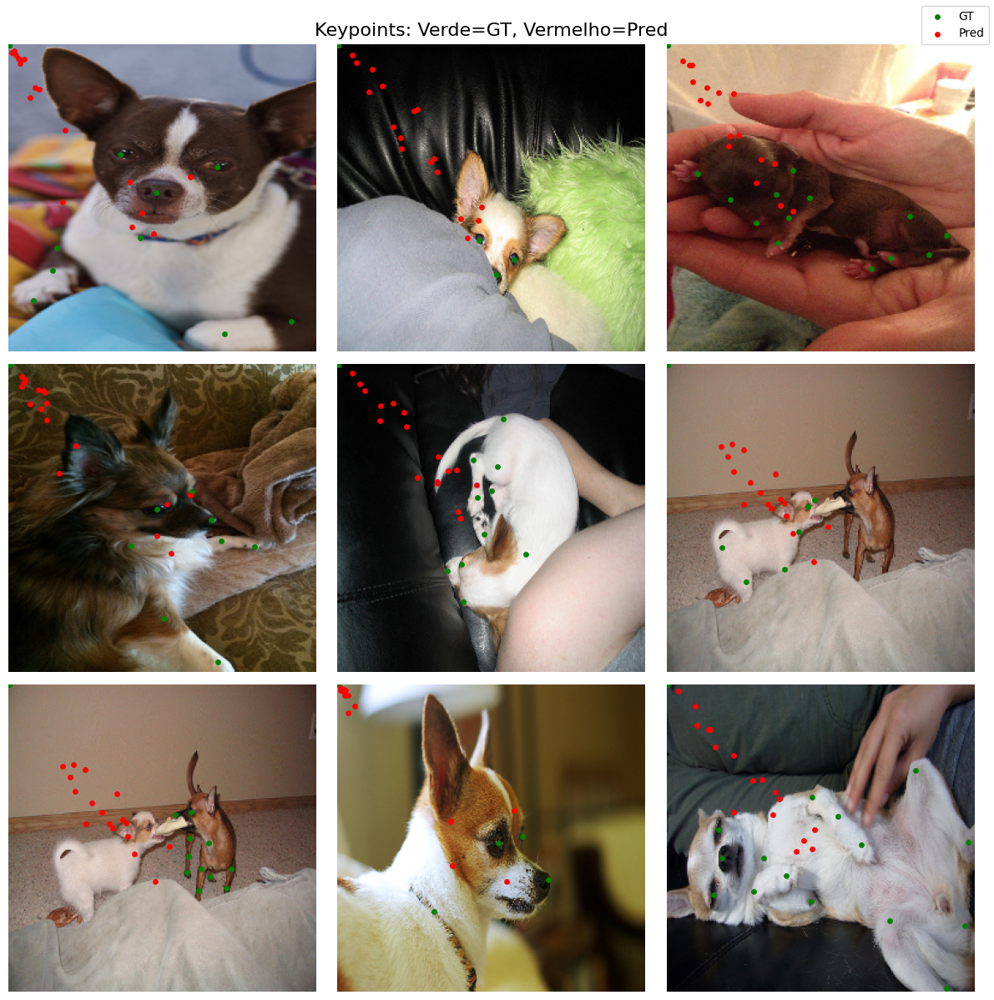

In [17]:
import matplotlib.pyplot as plt

model.eval()
batch = next(iter(val_loader))
imgs, targets = batch
with torch.no_grad():
    preds = model(imgs.cuda()).cpu().view(-1, num_joints, 3)

# Exibir as primeiras 9 imagens
fig, axes = plt.subplots(3, 3, figsize=(12, 12))
axes = axes.flatten()

mean = torch.tensor([0.485, 0.456, 0.406]).view(-1,1,1)
std  = torch.tensor([0.229, 0.224, 0.225]).view(-1,1,1)

for i, ax in enumerate(axes):
    img = imgs[i].clone() * std + mean
    img = img.mul(255).clamp(0,255).byte().permute(1,2,0).numpy()
    gt_kpt = targets[i].view(-1,3).numpy() * 256
    pred_kpt = preds[i].numpy() * 256

    ax.imshow(img)
    ax.scatter(gt_kpt[:,0], gt_kpt[:,1], c='g', s=15, label='GT')
    ax.scatter(pred_kpt[:,0], pred_kpt[:,1], c='r', s=15, label='Pred')
    ax.axis('off')

handles, labels = ax.get_legend_handles_labels()
fig.legend(handles, labels, loc='upper right')
fig.suptitle('Keypoints: Verde=GT, Vermelho=Pred', fontsize=16)
plt.tight_layout()
plt.show()


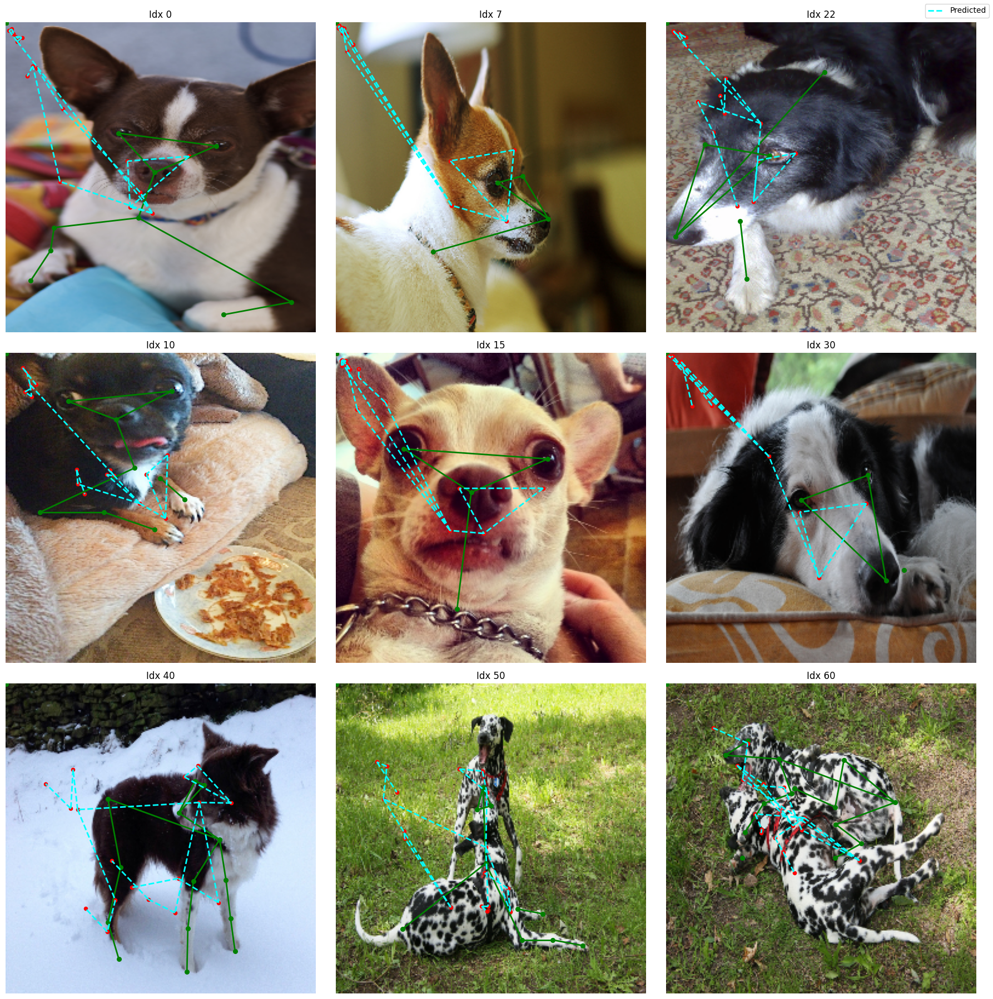

In [25]:
def plot_multiple_samples(indices):
    model.eval()
    fig, axes = plt.subplots(3, 3, figsize=(18, 18))
    axes = axes.flatten()

    for idx, ax in zip(indices, axes):
        img_t, kpt_true = val_ds[idx]
        with torch.no_grad():
            pr = model(img_t.unsqueeze(0).cuda()).cpu().view(-1, 3)

        # desnormaliza
        img_dn = img_t.clone()
        for c in range(3):
            img_dn[c].mul_(std[c]).add_(mean[c])
        img_byte = (img_dn.mul(255).clamp(0,255)
                         .byte()
                         .permute(1,2,0))
        img_list = img_byte.tolist()
        H, W, _ = img_byte.shape

        # coords em pixels
        gt_list = kpt_true.view(-1,3).cpu().tolist()
        gt_xy = [(p[0]*W, p[1]*H) for p in gt_list]
        pred_xy = [(p[0]*W, p[1]*H) for p in pr.tolist()]

        # mostra imagem
        ax.imshow(img_list)

        # conexões do esqueleto Ground Truth (verde)
        for a, b in skeleton:
            if gt_list[a][2] > 0 and gt_list[b][2] > 0:
                x0, y0 = gt_xy[a]
                x1, y1 = gt_xy[b]
                ax.plot([x0, x1], [y0, y1], '-', color='green', lw=2, label='Ground Truth' if (a,b)==skeleton[0] else "")

        # conexões do esqueleto Predicted (cyan)
        for a, b in skeleton:
            x0, y0 = pred_xy[a]
            x1, y1 = pred_xy[b]
            ax.plot([x0, x1], [y0, y1], '--', color='cyan', lw=2, label='Predicted' if (a,b)==skeleton[0] else "")

        # pontos individuais
        xs_gt, ys_gt = zip(*gt_xy)
        xs_pred, ys_pred = zip(*pred_xy)
        ax.scatter(xs_gt, ys_gt, c='green', s=30)
        ax.scatter(xs_pred, ys_pred, c='red', s=20)

        ax.set_title(f"Idx {idx}")
        ax.axis('off')

    handles, labels = ax.get_legend_handles_labels()
    by_label = dict(zip(labels, handles))
    fig.legend(by_label.values(), by_label.keys(), loc='upper right')
    plt.tight_layout()
    plt.show()

# Testa em 9 amostras
plot_multiple_samples([0, 7, 22, 10, 15, 30, 40, 50, 60])